# <CENTER> **Climate Change: Earth Surface Temperature Data**
<CENTER> -------------------------------------------------------------------------------------------------------------------

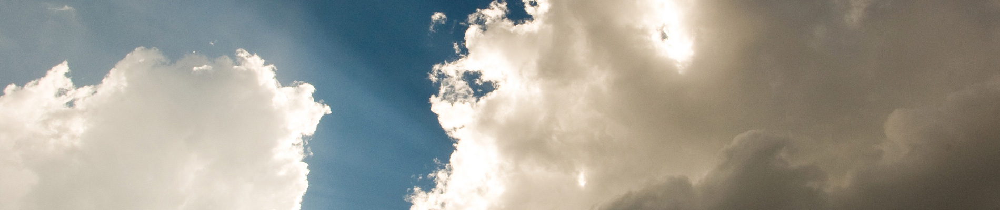

---

#### **Description:**

Some say climate change is the biggest threat of our age while others say it’s a myth based on dodgy science.

Even more than with other data sets that Kaggle has featured, there’s a huge amount of data cleaning and preparation that goes into putting together a long-time study of climate trends. Early data was collected by technicians using mercury thermometers, where any variation in the visit time impacted measurements. In the 1940s, the construction of airports caused many weather stations to be moved. In the 1980s, there was a move to electronic thermometers that are said to have a cooling bias.

Given this complexity, there are a range of organizations that collate climate trends data. The three most cited land and ocean temperature data sets are NOAA’s MLOST, NASA’s GISTEMP and the UK’s HadCrut.

We have repackaged the data from a newer compilation put together by the Berkeley Earth, which is affiliated with Lawrence Berkeley National Laboratory. The Berkeley Earth Surface Temperature Study combines 1.6 billion temperature reports from 16 pre-existing archives. It is nicely packaged and allows for slicing into interesting subsets (for example by country). They publish the source data and the code for the transformations they applied. They also use methods that allow weather observations from shorter time series to be included, meaning fewer observations need to be thrown away.

---


#### **Project goal:** 

Analyze long-term temperature trends for a selected country and build a forecasting model to predict future monthly temperatures using classical time series techniques and machine learning approaches.


---


#### **Stages of work on the project:**

The project will consist of four parts:

`1.` Basic analysis and familiarization with data,

`2.` Data preparing,

`3.` Feature Engineering,

`4.` Machine Learning.

---

**We import the necessary libraries:**

In [ ]:
# To work with data
import numpy as np
import pandas as pd
import os
os.makedirs('plots', exist_ok = True)


# To plot graphs:
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from IPython.display import Image


# Для разбиения данных и построения модели
from sklearn import linear_model
from sklearn import metrics

**Loading data:**

In [2]:
# Loading DataFrames
GLT_ByCity_data = pd.read_csv('data/GlobalLandTemperaturesByCity.csv')
GLT_ByCountry_data = pd.read_csv('data/GlobalLandTemperaturesByCountry.csv')
GLT_ByMajorCity_data = pd.read_csv('data/GlobalLandTemperaturesByMajorCity.csv')
GLT_ByState_data = pd.read_csv('data/GlobalLandTemperaturesByState.csv')
GlobalTemperatures_data = pd.read_csv('data/GlobalTemperatures.csv')


# Creating the copies of main DataFrames
GLT_ByCity_df = GLT_ByCity_data.copy()
GLT_ByCountry_df = GLT_ByCountry_data.copy()
GLT_ByMajorCity_df = GLT_ByMajorCity_data.copy()
GLT_ByState_df = GLT_ByState_data.copy()
GlobalTemperatures_df = GlobalTemperatures_data.copy()

=======================================================================================================================================

## <CENTER> **`1.` Basic analysis and familiarization with data**

At this stage, we will study the information provided.

#### $1.1$

#### **Выведем информацию по таблицам.**

Создаём функцию:

In [3]:
# Создадим функцию для вывода информации по датасету
def check_data_inf(data, data_name = None, length1 = None, length2 = None):
    
    # Выводим размеры таблицы
    print()
    print(f'====================| Данные таблицы "{data_name}" имеют следующую размерность: |====================\n')
    print('Количество строк: {};\nКоличество признаков (столбцов): {}.'.format(data.shape[0], data.shape[1]))
    print('-' * length1)

    # Выведем таблицу
    display(data)
    print('-' * length2)

Displaying the result:

In [4]:
# Creating a list with created datas
data_list = [
    GLT_ByCity_data,
    GLT_ByCountry_data,
    GLT_ByMajorCity_data,
    GLT_ByState_data,
    GlobalTemperatures_data
]

# Creating a list with data names
data_name_list = [
    'GLT_ByCity_data',
    'GLT_ByCountry_data',
    'GLT_ByMajorCity_data',
    'GLT_ByState_data',
    'GlobalTemperatures_data'
]



# Using 'for' cycle for displaying all created datas
for df, name in zip(data_list, data_name_list):
    
    # We're displaying the table information using 'check_data_inf' function
    check_data_inf(
        data = df.head(),
        data_name = name,
        length1 = 40,
        length2 = 100
    )
    print('\n\n')


====================| Данные таблицы "GLT_ByCity_data" имеют следующую размерность: |====================

Количество строк: 5;
Количество признаков (столбцов): 7.
----------------------------------------


,dt,AverageTemperature,AverageTemperatureUncertainty,City,Country,Latitude,Longitude
0,1743-11-01,6.068,1.737,Århus,Denmark,57.05N,10.33E
1,1743-12-01,NaN,NaN,Århus,Denmark,57.05N,10.33E
2,1744-01-01,NaN,NaN,Århus,Denmark,57.05N,10.33E
3,1744-02-01,NaN,NaN,Århus,Denmark,57.05N,10.33E
4,1744-03-01,NaN,NaN,Århus,Denmark,57.05N,10.33E


----------------------------------------------------------------------------------------------------




====================| Данные таблицы "GLT_ByCountry_data" имеют следующую размерность: |====================

Количество строк: 5;
Количество признаков (столбцов): 4.
----------------------------------------


,dt,AverageTemperature,AverageTemperatureUncertainty,Country
0,1743-11-01,4.384,2.294,Åland
1,1743-12-01,NaN,NaN,Åland
2,1744-01-01,NaN,NaN,Åland
3,1744-02-01,NaN,NaN,Åland
4,1744-03-01,NaN,NaN,Åland


----------------------------------------------------------------------------------------------------




====================| Данные таблицы "GLT_ByMajorCity_data" имеют следующую размерность: |====================

Количество строк: 5;
Количество признаков (столбцов): 7.
----------------------------------------


,dt,AverageTemperature,AverageTemperatureUncertainty,City,Country,Latitude,Longitude
0,1849-01-01,26.704,1.435,Abidjan,Côte D'Ivoire,5.63N,3.23W
1,1849-02-01,27.434,1.362,Abidjan,Côte D'Ivoire,5.63N,3.23W
2,1849-03-01,28.101,1.612,Abidjan,Côte D'Ivoire,5.63N,3.23W
3,1849-04-01,26.140,1.387,Abidjan,Côte D'Ivoire,5.63N,3.23W
4,1849-05-01,25.427,1.200,Abidjan,Côte D'Ivoire,5.63N,3.23W


----------------------------------------------------------------------------------------------------




====================| Данные таблицы "GLT_ByState_data" имеют следующую размерность: |====================

Количество строк: 5;
Количество признаков (столбцов): 5.
----------------------------------------


,dt,AverageTemperature,AverageTemperatureUncertainty,State,Country
0,1855-05-01,25.544,1.171,Acre,Brazil
1,1855-06-01,24.228,1.103,Acre,Brazil
2,1855-07-01,24.371,1.044,Acre,Brazil
3,1855-08-01,25.427,1.073,Acre,Brazil
4,1855-09-01,25.675,1.014,Acre,Brazil


----------------------------------------------------------------------------------------------------




====================| Данные таблицы "GlobalTemperatures_data" имеют следующую размерность: |====================

Количество строк: 5;
Количество признаков (столбцов): 9.
----------------------------------------


,dt,LandAverageTemperature,LandAverageTemperatureUncertainty,LandMaxTemperature,LandMaxTemperatureUncertainty,LandMinTemperature,LandMinTemperatureUncertainty,LandAndOceanAverageTemperature,LandAndOceanAverageTemperatureUncertainty
0,1750-01-01,3.034,3.574,NaN,NaN,NaN,NaN,NaN,NaN
1,1750-02-01,3.083,3.702,NaN,NaN,NaN,NaN,NaN,NaN
2,1750-03-01,5.626,3.076,NaN,NaN,NaN,NaN,NaN,NaN
3,1750-04-01,8.490,2.451,NaN,NaN,NaN,NaN,NaN,NaN
4,1750-05-01,11.573,2.072,NaN,NaN,NaN,NaN,NaN,NaN


----------------------------------------------------------------------------------------------------





#### **File Descriptions and Data Field Information**

Global Land and Ocean-and-Land Temperatures (**GlobalTemperatures.csv**):

  * `Date`: starts in $1750$ for average land temperature and $1850$ for max and min land temperatures and global ocean and land temperatures,

  * `LandAverageTemperature`: global average land temperature in celsius,

  * `LandAverageTemperatureUncertainty`: the $95$% confidence interval around the average,

  * `LandMaxTemperature`: global average maximum land temperature in celsius,

  * `LandMaxTemperatureUncertainty`: the $95$% confidence interval around the maximum land temperature,

  * `LandMinTemperature`: global average minimum land temperature in celsius,

  * `LandMinTemperatureUncertainty`: the $95$% confidence interval around the minimum land temperature,

  * `LandAndOceanAverageTemperature`: global average land and ocean temperature in celsius,

  * `LandAndOceanAverageTemperatureUncertainty`: the $95$% confidence interval around the global average land and ocean temperature;


Other files include:

  * Global Average Land Temperature by Country (**GlobalLandTemperaturesByCountry.csv**),

  * Global Average Land Temperature by State (**GlobalLandTemperaturesByState.csv**),

  * Global Land Temperatures By Major City (**GlobalLandTemperaturesByMajorCity.csv**),

  * Global Land Temperatures By City (**GlobalLandTemperaturesByCity.csv**).

---

#### $1.2$

Displaying information based on the features:

In [5]:
# Using 'for' cycle for displaying information about all created datas
for df, name, in zip(data_list, data_name_list):
    
    # information displaying
    print(f'\n==============| Информация датасета "{name}": |==============\n')
    display(df.info())
    print('-' * 55)
    print('\n\n')


==============| Информация датасета "GLT_ByCity_data": |==============

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8599212 entries, 0 to 8599211
Data columns (total 7 columns):
 #   Column                         Dtype  
---  ------                         -----  
 0   dt                             object 
 1   AverageTemperature             float64
 2   AverageTemperatureUncertainty  float64
 3   City                           object 
 4   Country                        object 
 5   Latitude                       object 
 6   Longitude                      object 
dtypes: float64(2), object(5)
memory usage: 459.2+ MB


None

-------------------------------------------------------




==============| Информация датасета "GLT_ByCountry_data": |==============

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 577462 entries, 0 to 577461
Data columns (total 4 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   dt                             577462 non-null  object 
 1   AverageTemperature             544811 non-null  float64
 2   AverageTemperatureUncertainty  545550 non-null  float64
 3   Country                        577462 non-null  object 
dtypes: float64(2), object(2)
memory usage: 17.6+ MB


None

-------------------------------------------------------




==============| Информация датасета "GLT_ByMajorCity_data": |==============

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 239177 entries, 0 to 239176
Data columns (total 7 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   dt                             239177 non-null  object 
 1   AverageTemperature             228175 non-null  float64
 2   AverageTemperatureUncertainty  228175 non-null  float64
 3   City                           239177 non-null  object 
 4   Country                        239177 non-null  object 
 5   Latitude                       239177 non-null  object 
 6   Longitude                      239177 non-null  object 
dtypes: float64(2), object(5)
memory usage: 12.8+ MB


None

-------------------------------------------------------




==============| Информация датасета "GLT_ByState_data": |==============

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 645675 entries, 0 to 645674
Data columns (total 5 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   dt                             645675 non-null  object 
 1   AverageTemperature             620027 non-null  float64
 2   AverageTemperatureUncertainty  620027 non-null  float64
 3   State                          645675 non-null  object 
 4   Country                        645675 non-null  object 
dtypes: float64(2), object(3)
memory usage: 24.6+ MB


None

-------------------------------------------------------




==============| Информация датасета "GlobalTemperatures_data": |==============

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3192 entries, 0 to 3191
Data columns (total 9 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   dt                                         3192 non-null   object 
 1   LandAverageTemperature                     3180 non-null   float64
 2   LandAverageTemperatureUncertainty          3180 non-null   float64
 3   LandMaxTemperature                         1992 non-null   float64
 4   LandMaxTemperatureUncertainty              1992 non-null   float64
 5   LandMinTemperature                         1992 non-null   float64
 6   LandMinTemperatureUncertainty              1992 non-null   float64
 7   LandAndOceanAverageTemperature             1992 non-null   float64
 8   LandAndOceanAverageTemperatur

None

-------------------------------------------------------





#### $1.3$

#### **Подсчитаем количество типов данных по признакам.**

Создаём функцию для подсчёта:

In [6]:
# Создаём функцию для рассчёта количества типов по признакам
def check_features_dtypes(data, data_name = None, length1 = None, length2 = None):
    
    # Подсчет количества признаков типа 'object', 'int64' и 'float64'      
    object_columns_count = data.select_dtypes(include = ['object']).shape[1]
    int64_columns_count = data.select_dtypes(include = ['int64']).shape[1]
    float64_columns_count = data.select_dtypes(include = ['float64']).shape[1]
    bool_columns_count = data.select_dtypes(include = ['bool']).shape[1]


    # Вывод результата
    print(f'\n======| В таблице "{data_name}" представлены признаки следующих типов: |======')
    print()

    print(f"Количество признаков типа 'object': {object_columns_count}")
    print(f"Количество признаков типа 'int64': {int64_columns_count}")
    print(f"Количество признаков типа 'float64': {float64_columns_count}")
    print(f"Количество признаков типа 'bool': {bool_columns_count}")
    print('-' * length2)

Выводим результат:

In [7]:
# Пройдёмся циклом 'for' по созданным спискам, и по каждой таблице выведем информацию
for df, name in zip(data_list, data_name_list):
    
    # Вывод информации
    check_features_dtypes(
        data = df,
        data_name = name,
        length1 = 70,
        length2 = 45
    )
    print('\n\n')


======| В таблице "GLT_ByCity_data" представлены признаки следующих типов: |======

Количество признаков типа 'object': 5
Количество признаков типа 'int64': 0
Количество признаков типа 'float64': 2
Количество признаков типа 'bool': 0
---------------------------------------------




======| В таблице "GLT_ByCountry_data" представлены признаки следующих типов: |======

Количество признаков типа 'object': 2
Количество признаков типа 'int64': 0
Количество признаков типа 'float64': 2
Количество признаков типа 'bool': 0
---------------------------------------------




======| В таблице "GLT_ByMajorCity_data" представлены признаки следующих типов: |======

Количество признаков типа 'object': 5
Количество признаков типа 'int64': 0
Количество признаков типа 'float64': 2
Количество признаков типа 'bool': 0
---------------------------------------------




======| В таблице "GLT_ByState_data" представлены признаки следующих типов: |======

Количество признаков типа 'object': 3
Количество призн

#### $1.4$

Выведем описательные характеристики по признакам:

In [8]:
# Пройдёмся циклом 'for' по созданным спискам, и по каждой таблице выведем информацию
for df, name in zip(data_list, data_name_list):
    
    # Вывод информации
    print(f'\n=========| Описательные характеристики датасета "{name}": |=========\n')
    display(df.describe())
    print('-' * 70)
    print('\n\n')


=========| Описательные характеристики датасета "GLT_ByCity_data": |=========



,AverageTemperature,AverageTemperatureUncertainty
count,8.235082e+06,8.235082e+06
mean,1.672743e+01,1.028575e+00
std,1.035344e+01,1.129733e+00
min,-4.270400e+01,3.400000e-02
25%,1.029900e+01,3.370000e-01
50%,1.883100e+01,5.910000e-01
75%,2.521000e+01,1.349000e+00
max,3.965100e+01,1.539600e+01


----------------------------------------------------------------------




=========| Описательные характеристики датасета "GLT_ByCountry_data": |=========



,AverageTemperature,AverageTemperatureUncertainty
count,544811.000000,545550.000000
mean,17.193354,1.019057
std,10.953966,1.201930
min,-37.658000,0.052000
25%,10.025000,0.323000
50%,20.901000,0.571000
75%,25.814000,1.206000
max,38.842000,15.003000


----------------------------------------------------------------------




=========| Описательные характеристики датасета "GLT_ByMajorCity_data": |=========



,AverageTemperature,AverageTemperatureUncertainty
count,228175.000000,228175.000000
mean,18.125969,0.969343
std,10.024800,0.979644
min,-26.772000,0.040000
25%,12.710000,0.340000
50%,20.428000,0.592000
75%,25.918000,1.320000
max,38.283000,14.037000


----------------------------------------------------------------------




=========| Описательные характеристики датасета "GLT_ByState_data": |=========



,AverageTemperature,AverageTemperatureUncertainty
count,620027.000000,620027.000000
mean,8.993111,1.287647
std,13.772150,1.360392
min,-45.389000,0.036000
25%,-0.693000,0.316000
50%,11.199000,0.656000
75%,19.899000,1.850000
max,36.339000,12.646000


----------------------------------------------------------------------




=========| Описательные характеристики датасета "GlobalTemperatures_data": |=========



,LandAverageTemperature,LandAverageTemperatureUncertainty,LandMaxTemperature,LandMaxTemperatureUncertainty,LandMinTemperature,LandMinTemperatureUncertainty,LandAndOceanAverageTemperature,LandAndOceanAverageTemperatureUncertainty
count,3180.000000,3180.000000,1992.000000,1992.000000,1992.000000,1992.000000,1992.000000,1992.000000
mean,8.374731,0.938468,14.350601,0.479782,2.743595,0.431849,15.212566,0.128532
std,4.381310,1.096440,4.309579,0.583203,4.155835,0.445838,1.274093,0.073587
min,-2.080000,0.034000,5.900000,0.044000,-5.407000,0.045000,12.475000,0.042000
25%,4.312000,0.186750,10.212000,0.142000,-1.334500,0.155000,14.047000,0.063000
50%,8.610500,0.392000,14.760000,0.252000,2.949500,0.279000,15.251000,0.122000
75%,12.548250,1.419250,18.451500,0.539000,6.778750,0.458250,16.396250,0.151000
max,19.021000,7.880000,21.320000,4.373000,9.715000,3.498000,17.611000,0.457000


----------------------------------------------------------------------





=======================================================================================================================================

## <CENTER> **`2.` Data preparing**

At this stage, we will create a time series of average temperatures for one country (we will chose one).

#### $2.1$

#### **The chose of the country.**

We will chose the `United States` for making our time series:

In [12]:
# Chosing of the country
GLT_by_USA = GLT_ByCountry_data[GLT_ByCountry_data['Country'] == 'United States']


# Information displaying
print('\n===================| Информация датасета "GLT_by_USA": |===================\n')
display(df.info())
print('-' * 75)


===================| Информация датасета "GLT_by_USA": |===================

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3192 entries, 0 to 3191
Data columns (total 9 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   dt                                         3192 non-null   object 
 1   LandAverageTemperature                     3180 non-null   float64
 2   LandAverageTemperatureUncertainty          3180 non-null   float64
 3   LandMaxTemperature                         1992 non-null   float64
 4   LandMaxTemperatureUncertainty              1992 non-null   float64
 5   LandMinTemperature                         1992 non-null   float64
 6   LandMinTemperatureUncertainty              1992 non-null   float64
 7   LandAndOceanAverageTemperature             1992 non-null   float64
 8   LandAndOceanAverageTemperatureUncertainty  1992 non-null   float64
dtypes: float64(8), obje

None

---------------------------------------------------------------------------


#### $2.2$

#### **Building the time series.**

Преобразуем столбец `dt` в формат **datetime**, затем установим даты как индекс и выделим столбец со средней температурой:

In [13]:
# Преобразование столбца dt в формат datetime
GLT_by_USA['dt'] = pd.to_datetime(GLT_by_USA['dt'])

# Установка даты как индекса
GLT_by_USA = GLT_by_USA.set_index('dt')

# Выборка столбца со средней температурой
TS_by_USA = GLT_by_USA['AverageTemperature']

# Создаём DataFrame
TS_by_USA = pd.DataFrame(
    data = TS_by_USA,
    columns = ['AverageTemperature']
)



# Выведем результат
check_data_inf(
    data = TS_by_USA.head(),
    data_name = 'TS_by_USA',
    length1 = 40,
    length2 = 30
)


====================| Данные таблицы "TS_by_USA" имеют следующую размерность: |====================

Количество строк: 5;
Количество признаков (столбцов): 1.
----------------------------------------


/var/folders/9z/th6zqsk53cbb_rkn6zr5cgzh0000gn/T/ipykernel_1647/4116261603.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,AverageTemperature
dt,
1768-09-01,15.420
1768-10-01,8.162
1768-11-01,1.591
1768-12-01,-2.882
1769-01-01,-3.952


------------------------------


Time series visualization:


=============================================| Визуализация временного ряда: |=============================================

---------------------------------------------------------------------------------------------------------------------------


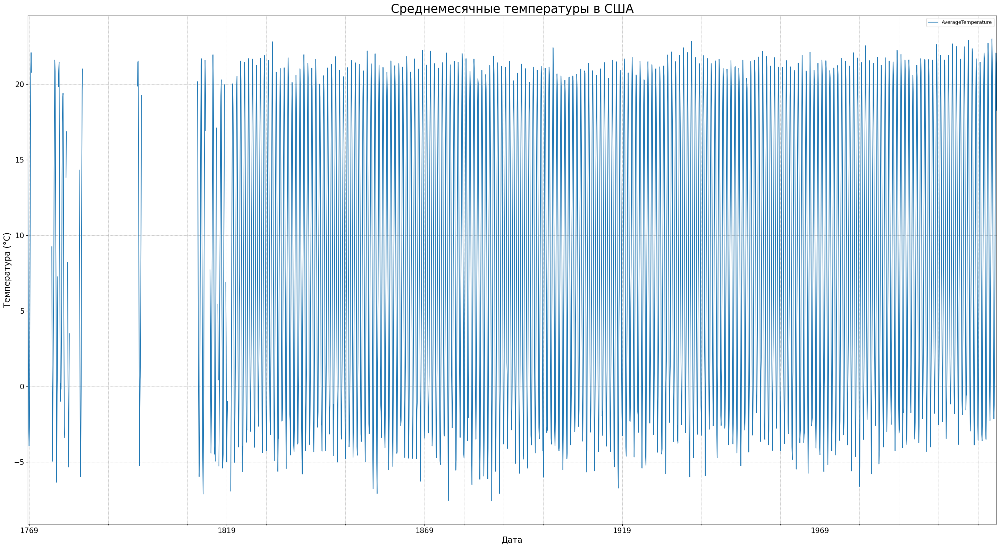

---------------------------------------------------------------------------------------------------------------------------


In [15]:
# Задаём заглавие для графика
print('\n=============================================| Визуализация временного ряда: |=============================================\n')
print('-' * 123)



# Задаём размер графика
plt.rcParams['figure.figsize'] = (30, 17)

# Визуализация временного ряда
TS_by_USA.plot()

# Настраиваем оформление графика
plt.title('Среднемесячные температуры в США', fontsize = 25)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel('Дата', fontsize = 17)
plt.ylabel('Температура (°C)', fontsize = 17)
plt.grid(True, which = 'both', linestyle = '--', linewidth = 0.5)
plt.tight_layout(pad = 5.0)

# Показываем график
plt.show()
print('-' * 123)

**Вывод:**

По графику хорошо видно, что температуры варьируются от отрицательных значений (ниже 0°C) до значений выше 20°C, что указывает на выраженную сезонность (зима и лето). Глядя на конец графика (более поздний временной промежуток) кажется, что средние температуры имеют тенденцию к росту к более поздним годам, что может быть связано с глобальным потеплением.

Так же в ранний период (XVIII–XIX века) данные выглядят более разрозненными, так как наблюдаются пропущенные значения.

#### $2.3$

#### **Выполним очистку данных.**

Перед прогнозированием важно убедиться:

* что нет пропусков дат;
* что нет странных выбросов:


====================| Данные таблицы "TS_by_USA_reindex" имеют следующую размерность: |====================

Количество строк: 5;
Количество признаков (столбцов): 1.
----------------------------------------


,AverageTemperature
1768-09-01,15.42
1768-09-02,0.00
1768-09-03,0.00
1768-09-04,0.00
1768-09-05,0.00


------------------------------



====================================| Временной ряд после проверки пропусков дат: |====================================

---------------------------------------------------------------------------------------------------------------------------


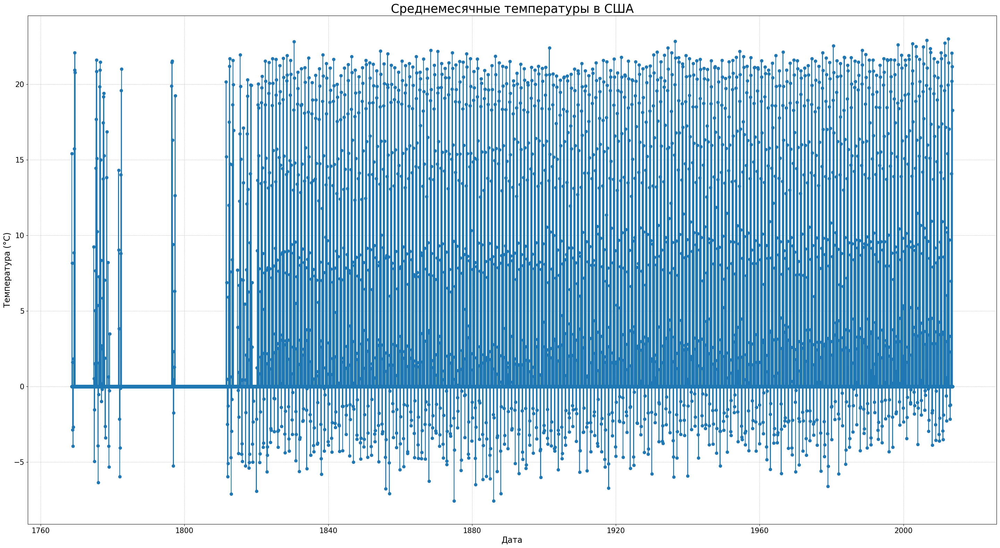

---------------------------------------------------------------------------------------------------------------------------



Количество пропущенных значений в данных: AverageTemperature    459
dtype: int64
----------------------------------------------------------------------


In [16]:
# Проверка пропусков дат
full_range = pd.date_range(
    start = TS_by_USA.index.min(),
    end = TS_by_USA.index.max(),
    freq = 'D'
)

TS_by_USA_reindex = TS_by_USA.reindex(full_range, fill_value = 0)




# Выведем результат
check_data_inf(
    data = TS_by_USA_reindex.head(),
    data_name = 'TS_by_USA_reindex',
    length1 = 40,
    length2 = 30
)

# Задаём заглавие для графика
print('\n\n\n====================================| Временной ряд после проверки пропусков дат: |====================================\n')
print('-' * 123)

# Задаём размер графика
plt.figure(figsize = (30, 17))

# Визуализация временного ряда
plt.plot(
    TS_by_USA_reindex.index, 
    TS_by_USA_reindex['AverageTemperature'], 
    marker = 'o'
)

# Настраиваем оформление графика
plt.title('Среднемесячные температуры в США', fontsize = 25)
plt.xlabel('Дата', fontsize = 17)
plt.ylabel('Температура (°C)', fontsize = 17)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.grid(True, which = 'both', linestyle = '--', linewidth = 0.5)
plt.tight_layout(pad = 5.0)

# Показываем график
plt.show()
print('-' * 123)
print('\n\n')



# Выведем количество пропусков в данных
print(f'Количество пропущенных значений в данных: {TS_by_USA.isna().sum()}')
print('-' * 70)

**Вывод:**

По результатам видно, что в данных присутствуют пропущенные значения. Так как временной ряд выражен сезонностью, оппробуем заполнить данные средним значением:

Заполним пропуски средним значением:

In [17]:
# Добавляем столбец с месяцем
GLT_by_USA['month'] = GLT_by_USA.index.month

# Создаём копию исходного временного ряда
TS_by_USA_copy = TS_by_USA.copy()



# Задаём заголовок
print('\n==========| Средние значения температур по месяцам и количество пропусков после обработки |==========\n\n')

# Заполняем пропуски средним значением температуры для каждого месяца
for month in range(1, 13):
    
    # Фильтруем данные по месяцу
    month_data = TS_by_USA[GLT_by_USA['month'] == month]['AverageTemperature']
    
    # Проверяем, что есть данные
    if not month_data.empty:
        
        # Вычисляем среднюю температуру
        month_mean = month_data.mean()
        print(f'Месяц {month}, среднее: {month_mean}')
        mask = (GLT_by_USA['month'] == month) & (TS_by_USA['AverageTemperature'].isna())
        TS_by_USA_copy.loc[mask] = month_mean
        
        

# Создаём DataFrame
TS_by_USA = pd.DataFrame(
    TS_by_USA_copy,
    columns = ['AverageTemperature']
)       

# Проверка результата
print(f'\nКоличество пропусков после заполнения: {TS_by_USA.isna().sum()}')
print('-' * 75)


==========| Средние значения температур по месяцам и количество пропусков после обработки |==========


Месяц 1, среднее: -3.861933014354067
Месяц 2, среднее: -1.8787259615384615
Месяц 3, среднее: 2.3634471153846155
Месяц 4, среднее: 7.995131067961166
Месяц 5, среднее: 13.793368932038836
Месяц 6, среднее: 18.746831730769234
Месяц 7, среднее: 21.38510294117647
Месяц 8, среднее: 20.355785365853656
Месяц 9, среднее: 15.905746341463415
Месяц 10, среднее: 9.183384615384616
Месяц 11, среднее: 2.438418269230769
Месяц 12, среднее: -2.6130096618357483

Количество пропусков после заполнения: AverageTemperature    0
dtype: int64
---------------------------------------------------------------------------


#### $2.4$

#### **Holdout-разбиение.**

Разделим временной ряд: первые $80$ наблюдений оставим для обучения, оставшиеся $20$ — для теста:


==========================================| Визуализация Train/Test разбиения: |==========================================

---------------------------------------------------------------------------------------------------------------------------


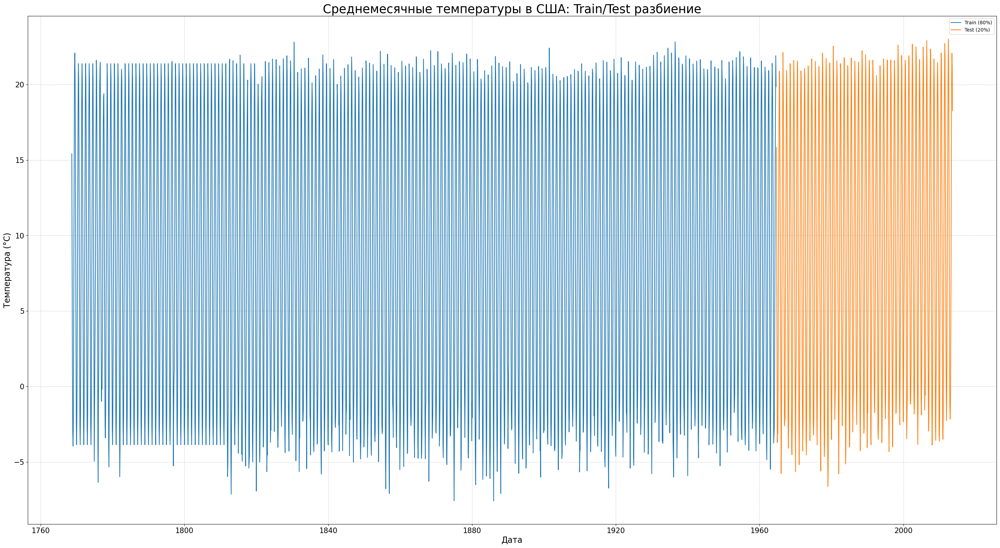

---------------------------------------------------------------------------------------------------------------------------
Размер train: 2352
Размер test: 589
Общее количество наблюдений: 2941
-----------------------------------


In [18]:
# Вычисляем индекс для разбиения (80% наблюдений)
split_index = int(len(TS_by_USA) * 0.8)

# Разбиение на train и test
train_data = TS_by_USA.iloc[:split_index]
test_data = TS_by_USA.iloc[split_index:]




# Задаём заголовок
print('\n==========================================| Визуализация Train/Test разбиения: |==========================================\n')
print('-' * 123)

# Задаём размер графика
plt.figure(figsize = (30, 17))

# Визуализация
plt.plot(train_data.index, train_data, label='Train (80%)', color='#1f77b4')
plt.plot(test_data.index, test_data, label='Test (20%)', color='#ff7f0e')

# Задаём заголовок и подписи осей
plt.title('Среднемесячные температуры в США: Train/Test разбиение', fontsize = 25)
plt.xlabel('Дата', fontsize = 17)
plt.ylabel('Температура (°C)', fontsize = 17)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.grid(True, which = 'both', linestyle = '--', linewidth = 0.5)
plt.tight_layout(pad = 5.0)
plt.legend()

# Показываем график
plt.show()
print('-' * 123)

# Проверка размеров
print(f'Размер train: {len(train_data)}')
print(f'Размер test: {len(test_data)}')
print(f'Общее количество наблюдений: {len(TS_by_USA)}')
print('-' * 35)

**Вывод:**

После разделения данных видно, что обучающая выборка охватывает исторический период с относительно стабильным климатическим режимом, тогда как тестовая выборка включает современный период, где визуально заметен сдвиг вверх среднего уровня температуры — признак глобального потепления.

#### $2.5$

#### **Скользящее окно.**

Реализуем `rolling-window`-разбиение: обучающие отрезки длиной $120$ месяцев ($10$ лет) и прогнозный горизонт $12$ месяцев:

In [19]:
# Задаём длину окна обучения и горизонта прогноза
window_size = 120  # 10 лет = 120 месяцев
horizon = 12       # 12 месяцев


# Количество возможных сплитов (общее наблюдений минус окно и горизонт)
num_splits = len(TS_by_USA) - window_size - horizon + 1

Визуализируем первые два сплита:


===========================================| Визуализация Train/Test разбиения: |==========================================

---------------------------------------------------------------------------------------------------------------------------


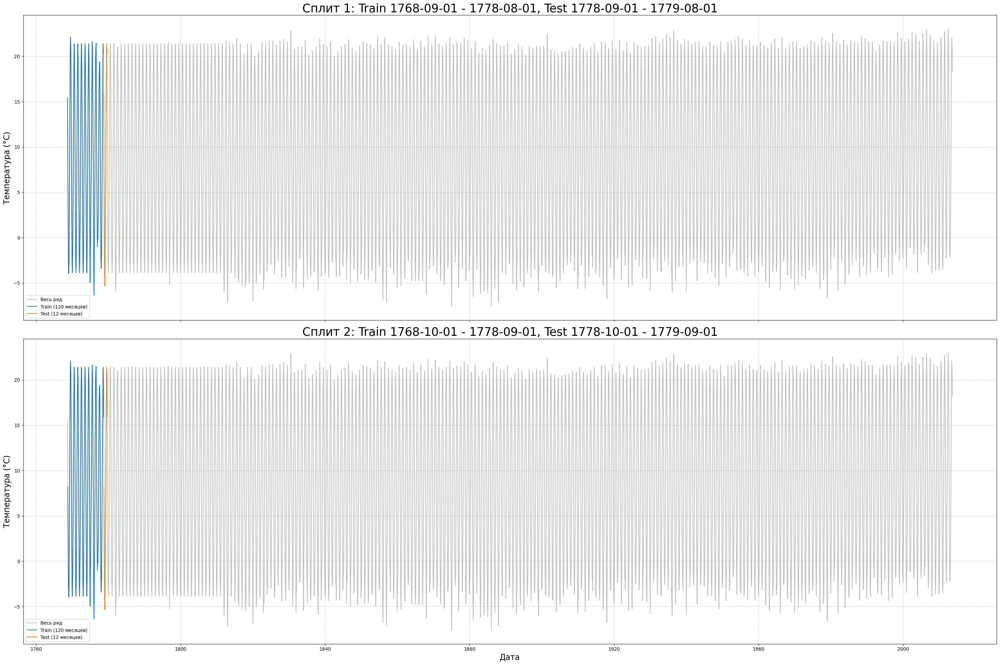

---------------------------------------------------------------------------------------------------------------------------


In [38]:
# Задаём заголовок
print('\n===========================================| Визуализация Train/Test разбиения: |==========================================\n')
print('-' * 123)

# Задаём параметры графика
fig, axes = plt.subplots(
    nrows = 2, 
    ncols = 1, 
    figsize = (30, 20), 
    sharex = True
)


# Визуализация первых двух сплитов
for i in range(2):
    
    # Определяем начало и конец для train и test в каждом сплите
    train_start = i
    train_end = train_start + window_size
    test_end = train_end + horizon
    
    # Получаем данные для сплита
    train_data = TS_by_USA.iloc[train_start:train_end]['AverageTemperature']
    test_data = TS_by_USA.iloc[train_end:test_end]['AverageTemperature']
    
    # Визуализация
    ax = axes[i]
    ax.plot(TS_by_USA.index, TS_by_USA['AverageTemperature'], color='gray', alpha=0.5, label='Весь ряд')
    ax.plot(train_data.index, train_data, color='#1f77b4', label='Train (120 месяцев)')
    ax.plot(test_data.index, test_data, color='#ff7f0e', label='Test (12 месяцев)')
    ax.set_title(f'Сплит {i+1}: Train {train_data.index[0].date()} - {train_data.index[-1].date()}, Test {test_data.index[0].date()} - {test_data.index[-1].date()}', fontsize = 25)
    ax.set_ylabel('Температура (°C)', fontsize = 17)
    ax.legend()
    ax.grid(True, which='both', linestyle='--', linewidth=0.5)

axes[1].set_xlabel('Дата', fontsize = 17)
plt.tight_layout()

# Показываем график
plt.show()
print('-' * 123)

Отдельно визуализируем один сплит:


======================================| Визуализация Train/Test разбиения с Plotly: |=====================================

---------------------------------------------------------------------------------------------------------------------------


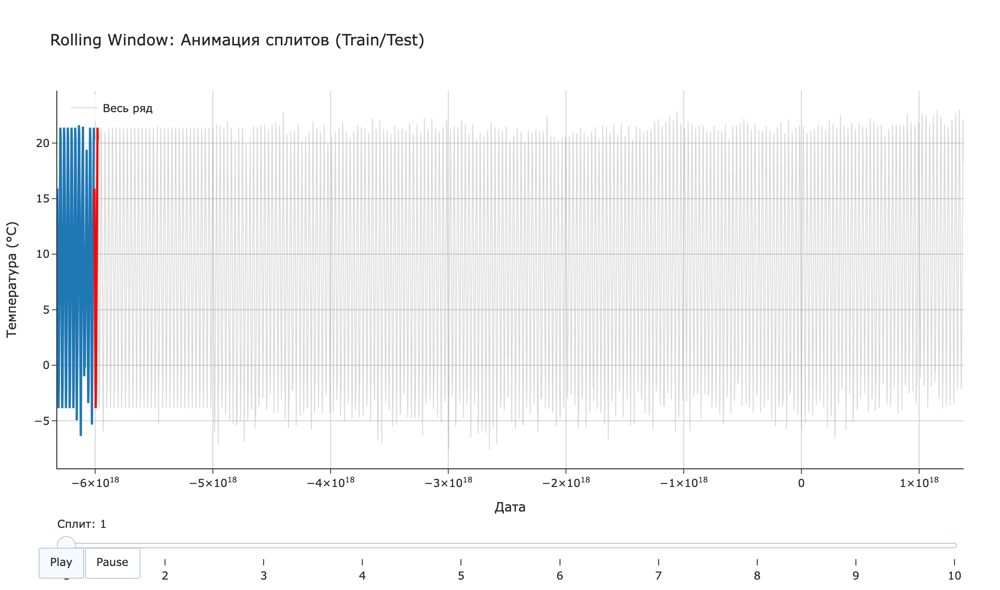

---------------------------------------------------------------------------------------------------------------------------
Window size: 120 месяцев, Horizon: 12 месяцев
Показано сплитов: 10
-----------------------------------


In [57]:
# Задаём заголовок
print('\n======================================| Визуализация Train/Test разбиения с Plotly: |=====================================\n')
print('-' * 123)





# --- Параметры ---
window_size = 120   # 10 лет
horizon = 12        # 1 год
n_splits = 10       # количество сплитов для анимации

# --- Подготовка данных ---
df = TS_by_USA_copy.copy()
df = df.dropna()  

# --- Создание фреймов для анимации ---
frames = []
sliders = []

# --- Создание фигуры ---
fig = go.Figure()

# --- Фоновый ряд (весь временной ряд) ---
fig.add_trace(
    go.Scatter(
        x = df.index,
        y = df['AverageTemperature'],
        mode = 'lines',
        name = 'Весь ряд',
        line = dict(color='gray', width = 1),
        opacity = 0.3,
        hoverinfo = 'skip',
        showlegend = True
    )
)

# Переменные для анимации
visible_traces = [True] 



# --- Создание сплитов ---
for i in range(n_splits):
    train_start = i
    train_end = train_start + window_size
    test_end = train_end + horizon
    
    # Проверка выхода за пределы данных
    if test_end > len(df):
        break  
    
    # Данные для текущего сплита 
    train_data = df.iloc[train_start:train_end]
    test_data = df.iloc[train_end:test_end]

    # --- Train trace (видим только в текущем и следующих кадрах) ---
    train_trace = go.Scatter(
        x = train_data.index,
        y = train_data['AverageTemperature'],
        mode = 'lines',
        name = f'Train {i+1}',
        line = dict(color='#1f77b4', width=2.5),
        visible = False,
        showlegend = False
    )
    fig.add_trace(train_trace)

    # --- Test trace ---
    test_trace = go.Scatter(
        x = test_data.index,
        y = test_data['AverageTemperature'],
        mode = 'lines',
        name = f'Test {i+1}',
        line = dict(color='#ff0404', width=2.5),
        visible = False,
        showlegend = False
    )
    
    # Добавляем trace в фигуру
    fig.add_trace(test_trace)




    # --- Кадр анимации ---
    frame_data = [
        go.Scatter(visible = True),  
        *[go.Scatter(visible = False) for _ in range(1, 1 + 2*i)],  
        go.Scatter(visible = True),
        go.Scatter(visible = True)   
    ]
    
    # Создаем кадр
    frame = go.Frame(
        data = frame_data,
        name = str(i),
        layout = go.Layout(
            title = f"Rolling Window: Split {i+1} | Train: {train_data.index[0].strftime('%Y-%m')} — {train_data.index[-1].strftime('%Y-%m')} | Test: {test_data.index[0].strftime('%Y-%m')} — {test_data.index[-1].strftime('%Y-%m')}"
        )
    )
    
    # Добавляем кадр в список
    frames.append(frame)




# --- Добавляем кадры в фигуру ---
fig.frames = frames

# --- Начальное состояние (первый сплит) ---
fig.data[1].visible = True  
fig.data[2].visible = True  

# --- Макет ---
fig.update_layout(
    title = 'Rolling Window: Анимация сплитов (Train/Test)',
    xaxis_title = 'Дата',
    yaxis_title = 'Температура (°C)',
    width = 1100,
    height = 650,
    margin = dict(l=60, r=40, t=100, b=60),
    template = 'simple_white',
    legend = dict(x=0.01, y=0.99, bgcolor='rgba(255,255,255,0.8)', bordercolor='gray'),
    hovermode = 'x unified'
)

# --- Сетки ---
fig.update_xaxes(showgrid=True, gridcolor='LightGray')
fig.update_yaxes(showgrid=True, gridcolor='LightGray')

# --- Слайдер ---
sliders = [
    dict(
        active = 0,
        currentvalue = {'prefix': 'Сплит: '},
        pad = {'t': 50},
        steps = [
            dict(
                method = 'animate',
                label = f'{i+1}',
                args = [ [str(i)], dict(mode='immediate', frame=dict(duration=800, redraw=True), transition=dict(duration=300)) ]
            ) for i in range(len(frames))
        ]
    )
]

# --- Добавляем слайдеры в макет ---
fig.update_layout(sliders=sliders)




# --- Кнопки play/pause ---
updatemenus = [
    dict(
        type = 'buttons',
        direction = 'left',
        buttons = [
            dict(label='Play', method='animate', args=[None, dict(frame=dict(duration=1000, redraw=True), fromcurrent=True, transition=dict(duration=300))]),
            dict(label='Pause', method='animate', args=[[None], dict(mode='immediate')])
        ],
        pad = {'r': 10, 't': 87},
        showactive = True,
        x = 0.1, 
        y = 0, 
        xanchor = 'right', 
        yanchor = 'top'
        )
]

# --- Добавляем кнопки в макет ---
fig.update_layout(updatemenus = updatemenus)

# --- Показ фигуры ---
fig.show()




# --- Сохранение в PNG (для GitHub) ---
fig.write_image(
    'plots/rolling_window_animation_frame0.png', 
    width = 1100, 
    height = 650, 
    scale = 2
)

# Показать первый кадр как превью
display(Image('plots/rolling_window_animation_frame0.png'))



# Вывод параметров
print('-'*123)
print(f'Window size: {window_size} месяцев, Horizon: {horizon} месяцев')
print(f'Показано сплитов: {n_splits}')
print('-'*35)

=====================================================================================================================================

## <CENTER> **`3.` Feature Engineering**

Для временного ряда создадим лаги (например, на $1$ и $12$ месяцев) и календарные признаки: номер месяца и индикатор зимнего сезона (декабрь — февраль).

#### $3.1$

Создаём лаги на $1$, $3$, $6$, $9$ и $12$ месяцев:

In [40]:
# Для начала создадим копию данных
TS_by_USA_copy = TS_by_USA.copy()

# Создаём список значений лагов
lags_list = (1, 3, 6, 9, 12)


# Создаём лаги при помощи цикла for
for lag in lags_list:
    TS_by_USA_copy[f'lag_{lag}'] = TS_by_USA_copy['AverageTemperature'].shift(lag)
    
    
    
# Выводим результат
check_data_inf(
    data = TS_by_USA_copy,
    data_name = 'TS_by_USA_copy',
    length1 = 40,
    length2 = 70
)


====================| Данные таблицы "TS_by_USA_copy" имеют следующую размерность: |====================

Количество строк: 2941;
Количество признаков (столбцов): 6.
----------------------------------------


,AverageTemperature,lag_1,lag_3,lag_6,lag_9,lag_12
dt,,,,,,
1768-09-01,15.420,NaN,NaN,NaN,NaN,NaN
1768-10-01,8.162,15.420,NaN,NaN,NaN,NaN
1768-11-01,1.591,8.162,NaN,NaN,NaN,NaN
1768-12-01,-2.882,1.591,15.420,NaN,NaN,NaN
1769-01-01,-3.952,-2.882,8.162,NaN,NaN,NaN
...,...,...,...,...,...,...
2013-05-01,14.073,6.970,-1.216,3.330,21.422,15.422
2013-06-01,20.198,14.073,2.289,-1.261,17.036,19.954
2013-07-01,22.074,20.198,6.970,-2.155,9.688,23.008


----------------------------------------------------------------------


#### $3.2$

Создаём календарные признаки:

In [41]:
# Создание признаков
TS_by_USA_copy['month'] = TS_by_USA_copy.index.month
TS_by_USA_copy['is_winter'] = TS_by_USA_copy.index.month.isin([12, 1, 2]).astype(int)

# Удаляем строки, образованные созданием лагов
TS_by_USA_copy = TS_by_USA_copy.dropna()



# Выводим результат
check_data_inf(
    data = TS_by_USA_copy,
    data_name = 'TS_by_USA_copy',
    length1 = 40,
    length2 = 100
)


====================| Данные таблицы "TS_by_USA_copy" имеют следующую размерность: |====================

Количество строк: 2929;
Количество признаков (столбцов): 8.
----------------------------------------


,AverageTemperature,lag_1,lag_3,lag_6,lag_9,lag_12,month,is_winter
dt,,,,,,,,
1769-09-01,15.905746,20.787000,20.933000,1.828,-2.882,15.420,9,0
1769-10-01,9.183385,15.905746,22.093000,8.843,-3.952,8.162,10,0
1769-11-01,2.438418,9.183385,20.787000,15.724,-2.684,1.591,11,0
1769-12-01,-2.613010,2.438418,15.905746,20.933,1.828,-2.882,12,1
1770-01-01,-3.861933,-2.613010,9.183385,22.093,8.843,-3.952,1,1
...,...,...,...,...,...,...,...,...
2013-05-01,14.073000,6.970000,-1.216000,3.330,21.422,15.422,5,0
2013-06-01,20.198000,14.073000,2.289000,-1.261,17.036,19.954,6,0
2013-07-01,22.074000,20.198000,6.970000,-2.155,9.688,23.008,7,0


----------------------------------------------------------------------------------------------------


=====================================================================================================================================

## <CENTER> **`4.` Machine Learning**

На данном этапе сделаем следующее:

* Построим модель (например, линейную регрессию, где целевая переменная — температура, а признаки — лаги и дата-фичи).

* Сделаем прогноз на тестовой выборке из **holdout**-разбиения.

* Посчитаем метрики `MAE`, `RMSE` и `MAPE`.

#### $4.1$

First, let's split our time series into training and test sets using holdout splitting:

In [50]:
# Вычисляем индекс для разбиения (80% наблюдений)
split_index = int(len(TS_by_USA_copy) * 0.8)

# Разбиение на train и test
train_data = TS_by_USA_copy.iloc[:split_index]
test_data = TS_by_USA_copy.iloc[split_index:]

Строим график:


======================================| Визуализация Train/Test разбиения с Plotly: |=====================================

---------------------------------------------------------------------------------------------------------------------------


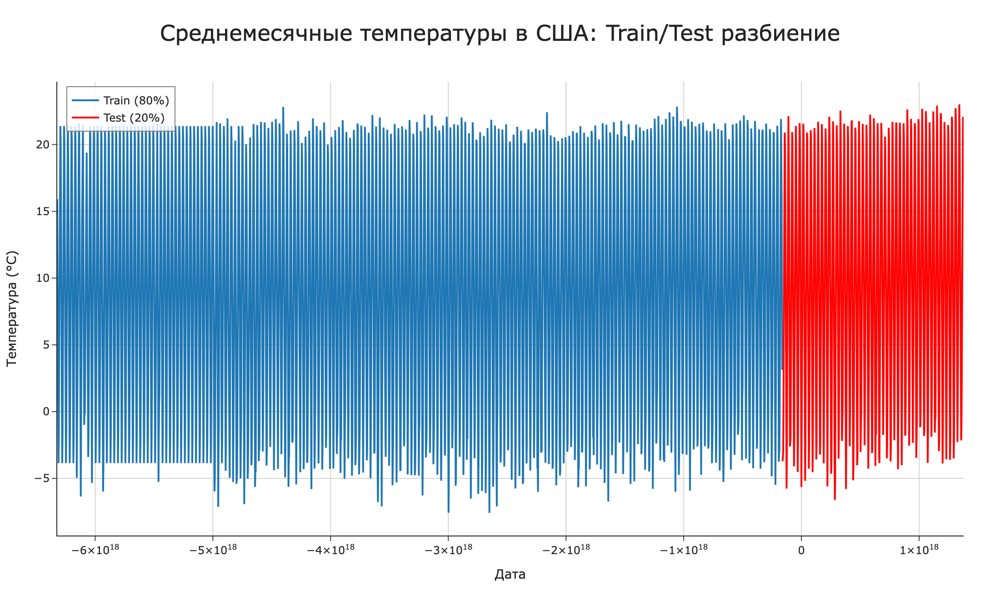

---------------------------------------------------------------------------------------------------------------------------
Размер train: 2343
Размер test: 586
Общее количество наблюдений: 2929
-----------------------------------


In [51]:
# Задаём заголовок
print('\n======================================| Визуализация Train/Test разбиения с Plotly: |=====================================\n')
print('-' * 123)




# --- Создаём фигуру ---
fig = go.Figure()

# Добавляем Train
fig.add_trace(
    go.Scatter(
        x = train_data.index,
        y = train_data['AverageTemperature'], 
        mode = 'lines',
        name = 'Train (80%)',
        line = dict(color = '#1f77b4', width = 2)
    )  
)

# Добавляем Test
fig.add_trace(
    go.Scatter(
        x = test_data.index,
        y = test_data['AverageTemperature'],
        mode = 'lines',
        name = 'Test (20%)',
        line = dict(color = '#ff0404', width = 2)
    )
)




# --- Макет ---
fig.update_layout(
    
    # Заголовок и подписи осей
    title = dict(
        text = 'Среднемесячные температуры в США: Train/Test разбиение',
        x = 0.5,
        xanchor = 'center',
        font = dict(size = 24)
    ),
    xaxis_title = 'Дата',
    yaxis_title = 'Температура (°C)',
    
    # Легенда
    legend = dict(
        x = 0.01, y = 0.99,
        bgcolor = 'rgba(255,255,255,0.8)',
        bordercolor = 'gray',
        borderwidth = 1
    ),
    
    # Всплывающие подсказки
    hovermode = 'x unified',
    template = 'simple_white',
    
    # Размер для экспорта (в пикселях)
    width = 1100,
    height = 650,
    margin = dict(l=60, r=40, t=90, b=60)
)




# --- Сетки на осях ---
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='LightGray', tickangle=0)
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='LightGray')




# --- Показ и сохранение графика ---
fig.show()
fig.write_image(
    'plots/train_test_split.png', 
    width = 1100, 
    height = 650, 
    scale = 2
)
display(Image('plots/train_test_split.png'))




# --- Информация ---
print('-' * 123)
print(f'Размер train: {len(train_data)}')
print(f'Размер test: {len(test_data)}')
print(f'Общее количество наблюдений: {len(TS_by_USA_copy)}')
print('-' * 35)

#### $4.2$

#### **Определение метрик.**

Используем следующие метрики для оценки:

* **RMSE (Root Mean Squared Error)**: Корень из $MSE$,

* **MAE (Mean Absolute Error)**: Cреднее абсолютное отклонение между предсказанными значениями модели и фактическими значениями,

* **MAPE (Mean Absolute Percentage Error)**: Cредняя абсолютная процентная ошибка.

Создадим функцию для вычисления метрик:

In [ ]:
# Создаём функцию 'print_metrics'       
def print_metrics(y_true, y_predict, model_name, decimal_places = 3):
    
    
    '''
    Данная функция вычисляет и выводит метрики (MSE, RMSE, R², MAE, MAPE) для оценки модели.
    
    Параметры:
    - y_true: истинные значения (например, y_valid_log)
    - y_pred: предсказанные значения (например, y_lr_predict)
    - model_name: строка с названием модели (например, "LinearRegression")
    - decimal_places: количество знаков после запятой для форматирования (задаём по умолчанию 3)
    
    Возвращает:
    - Словарь с метриками (rmse, mae, mape)
    
    '''
    
    
    # Вычисляем метрики
    mse_metric = metrics.mean_squared_error(y_true, y_predict)
    rmse_metric = np.sqrt(mse_metric)
    mae_metric = metrics.mean_absolute_error(y_true, y_predict)
    
    # Вычисляем MAPE с проверкой на нули в y_true
    y_true = np.array(y_true)
    y_predict = np.array(y_predict)
    non_zero_mask = y_true != 0
    
    if np.sum(non_zero_mask) > 0:
        mape_metric = np.mean(np.abs((y_true[non_zero_mask] - y_predict[non_zero_mask]) / y_true[non_zero_mask])) * 100
    else:
        mape_metric = np.nan
    
    
    
    # Выведем результат
    print(f'\n==================| {model_name} (значения метрик): |==================\n')
    print(f'Root Mean Squared Error: {rmse_metric:.{decimal_places}f}')
    print('-' * 35)
    print(f'Mean Absolute Error: {mae_metric:.{decimal_places}f}')
    print('-' * 35)
    print(f'Mean Absolute Percentage Error: {mape_metric:.{decimal_places}f}%' if not np.isnan(mape_metric) else 'Mean Absolute Percentage Error: Not defined (due to zeros in y_true)')
    print('-' * 40)

#### $4.3$

#### **Обучаем модель.**

Разделяем данные на матрицу наблюдений и вектор правильных ответов:

In [ ]:
# Тренировочная выборка
X_train = train_data[['lag_1', 'lag_12', 'month', 'is_winter']]
y_train = train_data['AverageTemperature']

# Тестовая выборка
X_test = test_data[['lag_1', 'lag_12', 'month', 'is_winter']]
y_test = test_data['AverageTemperature']




# Информация по тренеровочной выборке
check_data_inf(
    data = X_train.head(),
    data_name = 'X_train',
    length1 = 40,
    length2 = 100
)
print('\n\n\n')

# Информация по тестовой выборке
check_data_inf(
    data = X_test.head(),
    data_name = 'X_test',
    length1 = 40,
    length2 = 100
)


====================| Данные таблицы "X_train" имеют следующую размерность: |====================

Количество строк: 5;
Количество признаков (столбцов): 4.
----------------------------------------


,lag_1,lag_12,month,is_winter
dt,,,,
1769-09-01,20.787000,15.420,9,0
1769-10-01,15.905746,8.162,10,0
1769-11-01,9.183385,1.591,11,0
1769-12-01,2.438418,-2.882,12,1
1770-01-01,-2.613010,-3.952,1,1


----------------------------------------------------------------------------------------------------





====================| Данные таблицы "X_test" имеют следующую размерность: |====================

Количество строк: 5;
Количество признаков (столбцов): 4.
----------------------------------------


,lag_1,lag_12,month,is_winter
dt,,,,
1964-12-01,3.129,-3.749,12,1
1965-01-01,-3.718,-3.196,1,1
1965-02-01,-3.194,-2.786,2,1
1965-03-01,-3.053,0.683,3,0
1965-04-01,0.886,7.849,4,0


----------------------------------------------------------------------------------------------------


Обучаем модель, делаем прогноз и рассчитываем метрики:

In [32]:
# Создаём объект класса LinearRegression()
LR_model = linear_model.LinearRegression()

# Обучаем модель
LR_model.fit(X_train, y_train)

# Делаем прогноз на тестовой выборке
y_lr_predict = LR_model.predict(X_test)



# Рассчитываем метрики
print_metrics(y_test, y_lr_predict, 'LinearRegression')


==================| LinearRegression (значения метрик): |==================

Root Mean Squared Error: 1.171
-----------------------------------
Mean Absolute Error: 0.885
-----------------------------------
Mean Absolute Percentage Error: 64.299%
----------------------------------------


Построим график прогноза:


===============================| Визуализация прогноза LinearRegression: |===============================

---------------------------------------------------------------------------------------------------------------------------


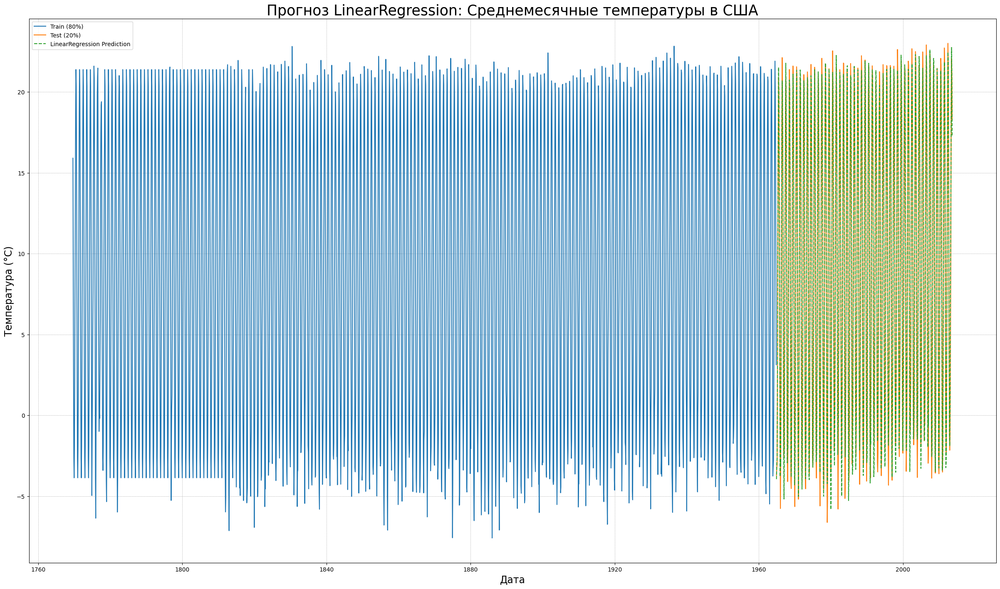

---------------------------------------------------------------------------------------------------------------------------




===============================| Визуализация прогноза LinearRegression на тестовой выборке: |===============================

---------------------------------------------------------------------------------------------------------------------------


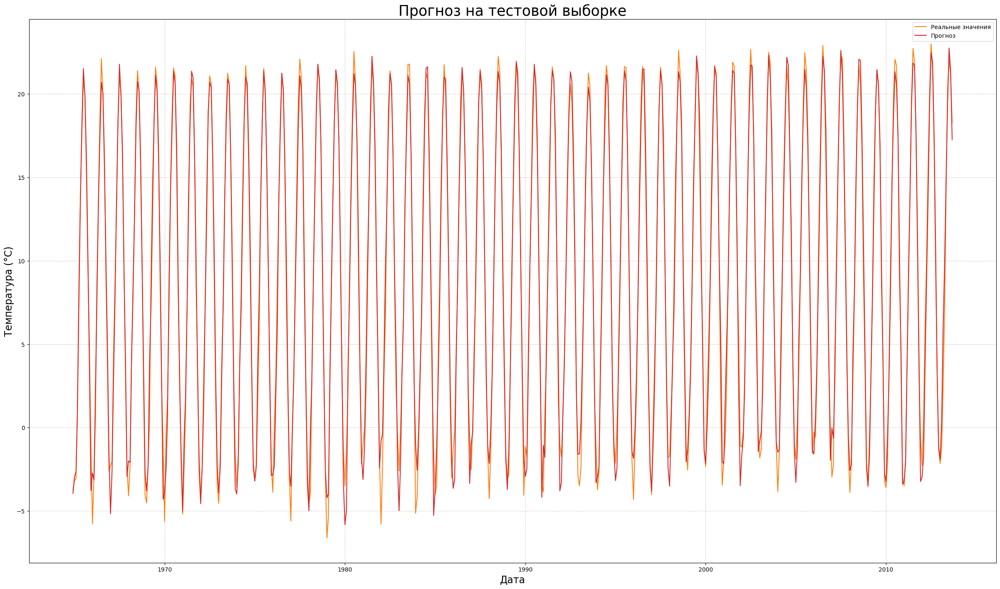

---------------------------------------------------------------------------------------------------------------------------


In [ ]:
# Задаём заголовок для графика
print('\n========================================| Визуализация прогноза LinearRegression: |========================================\n')
print('-' * 123)    

# Задаём размер графика
plt.figure(figsize = (30, 17))

# Визуализация
plt.plot(train_data.index, train_data['AverageTemperature'], label='Train (80%)', color='#1f77b4')
plt.plot(test_data.index, test_data['AverageTemperature'], label='Test (20%)', color='#ff7f0e')
plt.plot(test_data.index, y_lr_predict, label='LinearRegression Prediction', color='#2ca02c', linestyle='--')
plt.title('Прогноз LinearRegression: Среднемесячные температуры в США', fontsize = 25)
plt.xlabel('Дата', fontsize = 17)
plt.ylabel('Температура (°C)', fontsize = 17)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.legend()

# Показываем график
plt.show()
print('-' * 123)
print('\n\n')




# Задаём заголовок для графика
print('\n==============================| Визуализация прогноза LinearRegression на тестовой выборке: |==============================\n')
print('-' * 123)

# Задаём размер графика
plt.figure(figsize = (30, 17))

# Визуализация
plt.plot(test_data.index, y_test, label='Реальные значения', color='#ff7f0e')
plt.plot(test_data.index, y_lr_predict, label='Прогноз', color='#d62728')
plt.title('Прогноз на тестовой выборке', fontsize = 25)
plt.xlabel('Дата', fontsize = 17)
plt.ylabel('Температура (°C)', fontsize = 17)
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Показываем график
plt.show()
print('-' * 123)

#### **Вывод:**

Метрики **RMSE** и **MAE** показывают довольно приемлемые значения для климатических данных. Касаемо метрики **MAPE**, то она показывает слишком высокое значение, что может свидетельствовать о плохом улавливании моделью вариаций (прим. сезонность или тренды), что может быть реальной причиной, так как ранее мы выявили выраженную сезонность в данных.